# Exploration_16

## 1. Pix2Pix

### 1.1 Module

- 사용할 패키지를 설치합니다.

In [ ]:
# !pip install tensorflow-gpu==2.1-rc2

In [ ]:
# !pip install --upgrade pip

In [ ]:
# !pip install tensorflow-gpu

In [1]:
! pip install tensorflow_addons

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.1 MB 4.1 MB/s 


In [2]:
! pip install colorama

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
! pip install adabelief-tf==0.2.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
import os
import cv2
import time
import numpy as np
from IPython import display
from google.colab import drive
from matplotlib import pyplot as plt
from adabelief_tf import AdaBeliefOptimizer
import tensorflow as tf
from tensorflow import data
from tensorflow import image
from tensorflow.keras import losses
from tensorflow.keras import optimizers
from tensorflow.keras import layers, Input, Model
from tensorflow.python.ops.gen_math_ops import segment_prod
from tensorflow.keras.preprocessing.image import random_rotation

### 1.2 Function

### 1.3 Image

#### 1.3.1 Image load

- 구글 드라이브를 마운트합니다.

In [5]:
drive.mount('/gdrive')

Mounted at /gdrive


- 사용할 데이터를 불러옵니다.

In [6]:
data_path = '/gdrive/My Drive/Colab Notebooks/cityscapes/'
train_path = data_path+'train/'
val_path = data_path+'val/'

print("number of train examples :", len(os.listdir(train_path)))
print("number of validation examples :", len(os.listdir(val_path)))

number of train examples : 1000
number of validation examples : 5


- 랜덤하게 6장 정도만 확인해봅니다.

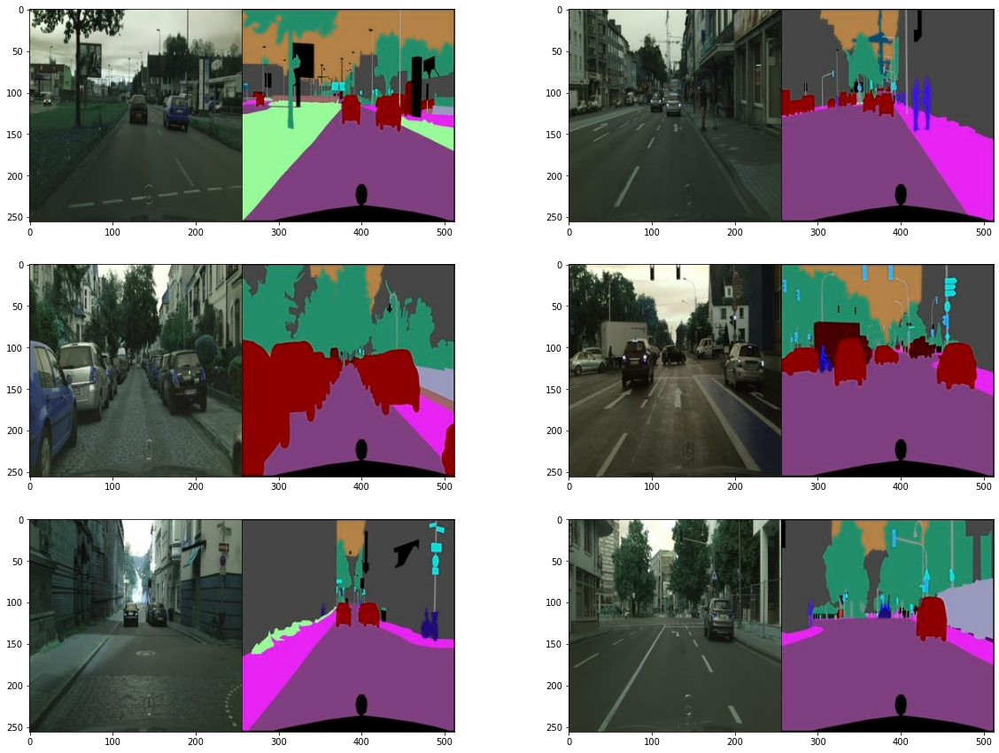

In [7]:
plt.figure(figsize=(20,15))
for i in range(1, 7):
    f = train_path + os.listdir(train_path)[np.random.randint(800)]
    img = cv2.imread(f, cv2.IMREAD_COLOR)
    plt.subplot(3,2,i)
    plt.imshow(img)

- 하나의 도로 이미지에 색상으로 segmentation된 이미지가 같이 나옵니다.

In [8]:
f = train_path + os.listdir(train_path)[0]
img = cv2.imread(f, cv2.IMREAD_COLOR)
print(img.shape)

(256, 512, 3)


- size는 (256, 512, 3)입니다.
- 이미지에서 확인할 수 있듯 512의 절반지점, 256을 잘라 나눌 수 있습니다.

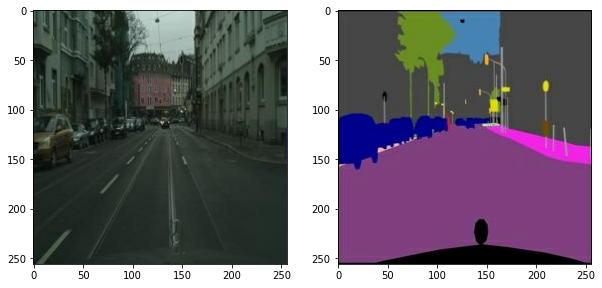

In [9]:
def normalize(x):  # 이미지 정규화 함수
    x = tf.cast(x, tf.float32)
    return (x/127.5) - 1

def denormalize(x):  # 이미지 시각화를 위한 복원 함수
    x = (x+1)*127.5
    x = x.numpy()
    return x.astype(np.uint8)

def load_img(img_path):  # 이미지 load 함수
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, 3)
    
    w = tf.shape(img)[1] // 2
    segment = img[:, w:, :] 
    segment = tf.cast(segment, tf.float32)
    city = img[:, :w, :] 
    city = tf.cast(city, tf.float32)
    return normalize(segment), normalize(city)

f = train_path + os.listdir(train_path)[1]
segment, city = load_img(f)

plt.figure(figsize=(10,7))
plt.subplot(1,2,1); plt.imshow(denormalize(city))
plt.subplot(1,2,2); plt.imshow(denormalize(segment))

- 잘 나뉘었습니다.

In [10]:
print("number of train examples :", len(os.listdir(train_path)))
print("number of validation examples :", len(os.listdir(val_path)))

number of train examples : 1000
number of validation examples : 5


- train으로 구할 수 있는 이미지는 1000장 입니다.  
데이터를 증강할 필요가 있습니다.

#### 1.3.2 Augmentation

- apply_augmentation 함수를 만듭니다.  
- 두 이미지를 넣어 rotate, crop 등의 과정을 동시에 수행합니다.  
- 이런식으로 이미지를 augmentation 합니다.

In [11]:
@tf.function() # 빠른 텐서플로 연산을 위해 @tf.function()을 사용합니다. 
def apply_augmentation(segment, city):
    stacked = tf.concat([segment, city], axis=-1)
    
    _pad = tf.constant([[30,30],[30,30],[0,0]])
    if tf.random.uniform(()) < .5:
        padded = tf.pad(stacked, _pad, "REFLECT")
    else:
        padded = tf.pad(stacked, _pad, "CONSTANT", constant_values=1.)

    out = image.random_crop(padded, size=[256, 256, 6])
    out = image.random_flip_left_right(out)
    out = image.random_flip_up_down(out)
    
    if tf.random.uniform(()) < .5:
        degree = tf.random.uniform([], minval=1, maxval=4, dtype=tf.int32)
        out = image.rot90(out, k=degree)
    
    return out[...,:3], out[...,3:]   

제대로 augmentation이 적용된 모습을 확인 할 수 있습니다.
padd가 CONSTANT라면 흰색으로 보이는 부분으로 채워지고, padd가 REFLECT라면 반전된 성분이 붙여집니다.

- augmentation을 적용한 이미지를 일부만 살펴봅니다.

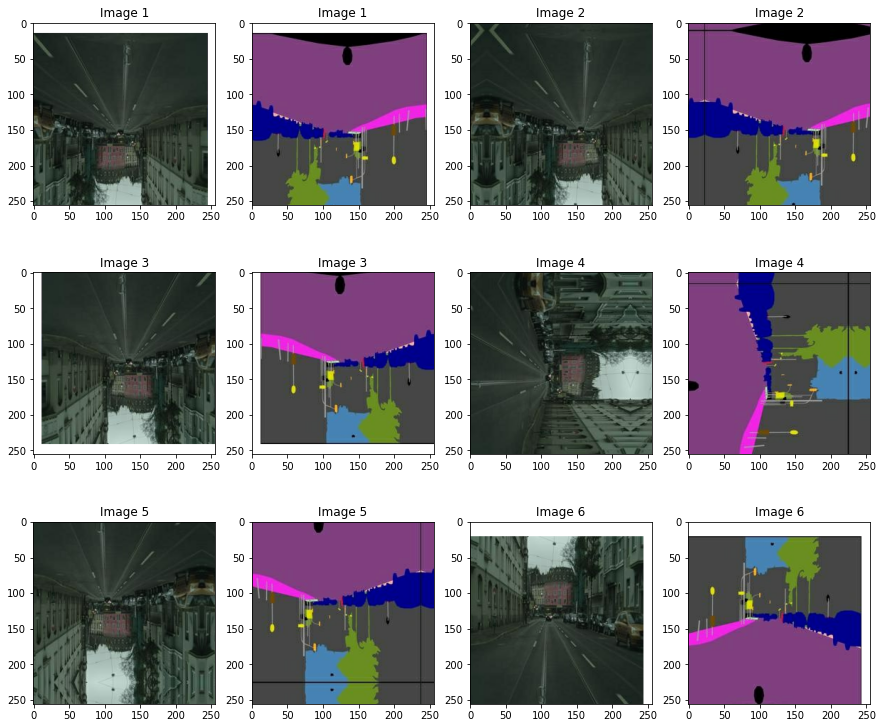

In [12]:
plt.figure(figsize=(15,13))
img_n = 1

for i in range(1, 13, 2):
    augmented_segment, augmented_city = apply_augmentation(segment, city)
    
    plt.subplot(3,4,i)
    plt.imshow(denormalize(augmented_city)); plt.title(f"Image {img_n}")
    plt.subplot(3,4,i+1); 
    plt.imshow(denormalize(augmented_segment)); plt.title(f"Image {img_n}")
    img_n += 1

- train에 apply_augentation을 적용합니다.

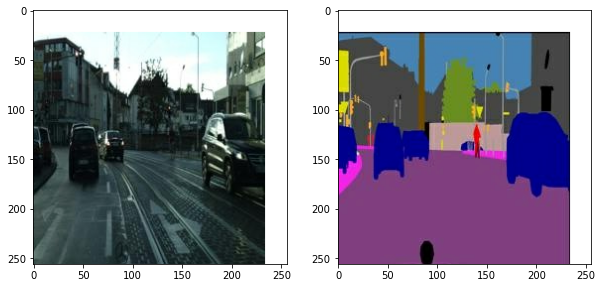

In [14]:
def get_train(img_path):
    segment, city = load_img(img_path)
    segment, city = apply_augmentation(segment, city)
    return segment, city

train_images = data.Dataset.list_files(train_path + "*.jpg")
train_images = train_images.map(get_train).shuffle(100).batch(4)

sample = train_images.take(1)
sample = list(sample.as_numpy_iterator())
segment, city = (sample[0][0]+1)*127.5, (sample[0][1]+1)*127.5

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(city[0].astype(np.uint8))
plt.subplot(1,2,2); plt.imshow(segment[0].astype(np.uint8))

### 1.4 Model(Default, Adam, epoch=100)

#### 1.4.1 Generator

##### 1) Endocer

- generator의 encoder layer를 만듭니다.

In [ ]:
class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu= layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

In [ ]:
class Encoder(layers.Layer):
    def __init__(self):
        super(Encoder, self).__init__()
        filters = [64,128,256,512,512,512,512,512]
        
        self.blocks = []
        for i, f in enumerate(filters):
            if i == 0:
                self.blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.blocks.append(EncodeBlock(f))
    
    def call(self, x):
        for block in self.blocks:
            x = block(x)
        return x
    
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

In [ ]:
Encoder().get_summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 encode_block (EncodeBlock)  (None, 128, 128, 64)      3072      
                                                                 
 encode_block_1 (EncodeBlock  (None, 64, 64, 128)      131584    
 )                                                               
                                                                 
 encode_block_2 (EncodeBlock  (None, 32, 32, 256)      525312    
 )                                                               
                                                                 
 encode_block_3 (EncodeBlock  (None, 16, 16, 512)      2099200   
 )                                                               
                                                             

- 8개의 layer입니다.

##### 2) Decoder

In [ ]:
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)

    
class Decoder(layers.Layer):
    def __init__(self):
        super(Decoder, self).__init__()
        filters = [512,512,512,512,256,128,64]
        
        self.blocks = []
        for i, f in enumerate(filters):
            if i < 3:
                self.blocks.append(DecodeBlock(f))
            else:
                self.blocks.append(DecodeBlock(f, dropout=False))
                
        self.blocks.append(layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False))
        
    def call(self, x):
        for block in self.blocks:
            x = block(x)
        return x
            
    def get_summary(self, input_shape=(1,1,256)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

In [ ]:
Decoder().get_summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 1, 1, 256)]       0         
                                                                 
 decode_block (DecodeBlock)  (None, 2, 2, 512)         2099200   
                                                                 
 decode_block_1 (DecodeBlock  (None, 4, 4, 512)        4196352   
 )                                                               
                                                                 
 decode_block_2 (DecodeBlock  (None, 8, 8, 512)        4196352   
 )                                                               
                                                                 
 decode_block_3 (DecodeBlock  (None, 16, 16, 512)      4196352   
 )                                                               
                                                           

- 마찬가지로 8개의 레이어로 size를 맞춰줍니다.

#### 1.4.2 U-Net Generator

- 위에서 만든 Encoder, Decoder를 연결해줍니다.

In [ ]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512]
        decode_filters = [512,512,512,512,256,128,64]
        
        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))
        
        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))
        
        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)
    
    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)
        
        features = features[:-1]
                    
        for block, feat in zip(self.decode_blocks, features[::-1]):
            x = block(x)
            x = layers.Concatenate()([x, feat])
        
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

In [ ]:
UNetGenerator().get_summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 encode_block_8 (EncodeBlock)   (None, 128, 128, 64  3072        ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 encode_block_9 (EncodeBlock)   (None, 64, 64, 128)  131584      ['encode_block_8[0][0]']         
                                                                                            

#### 1.4.3 Discriminator

- Generator를 만들었으니 Discriminator도 만듭니다.

In [ ]:
class DiscBlock(layers.Layer):
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act
        
        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)
        
        self.batchnorm = layers.BatchNormalization() if use_bn else None
        self.lrelu = layers.LeakyReLU(0.2) if act else None
        
    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)
                
        if self.use_bn:
            x = self.batchnorm(x)
            
        if self.act:
            x = self.lrelu(x)
        return x 

In [ ]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.block1 = layers.Concatenate()
        self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
        self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block5 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
        self.block6 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
        self.sigmoid = layers.Activation("sigmoid")
    
    def call(self, x, y):
        out = self.block1([x, y])
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        return self.sigmoid(out)
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()

In [ ]:
Discriminator().get_summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_5 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 concatenate_7 (Concatenate)    (None, 256, 256, 6)  0           ['input_4[0][0]',                
                                                                  'input_5[0][0]']          

- 이미 summary를 통해 알고 있지만 (256, 256, 3)을 넣어 나오는 (30,30) 출력을 확인합니다.

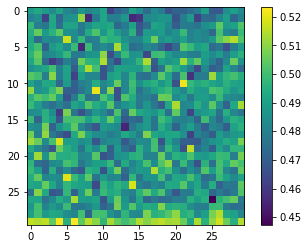

In [ ]:
x = tf.random.normal([1,256,256,3])
y = tf.random.uniform([1,256,256,3])

disc_out = Discriminator()(x, y)
plt.imshow(disc_out[0, ... ,0])
plt.colorbar()

#### 1.4.4 Loss

- GAN loss에 L1 loss를 추가로 이용합니다. 

In [ ]:
bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()

def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss

def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

- optimizer도 설정합니다.

In [ ]:
gene_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)
disc_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)

### 1.5 Train

##### 1) Train Step

- epoch를 돌리면서 수행할 train step입니다.  
generator 예측, discriminator 예측, 각각의 loss 값 계산을 수행합니다.

In [ ]:
@tf.function
def train_step(segment, real_city):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake_city = generator(segment, training=True)
        # Discriminator 예측
        fake_disc = discriminator(segment, fake_city, training=True)
        real_disc = discriminator(segment, real_city, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_city, real_city, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

##### 2) Train

- 학습을 수행합니다.  
epoch는 100으로 진행합니다.  
(print 출력이 길어 확인만하고 깔끔하게 지웠습니다.)

In [ ]:
EPOCHS = 100

history = {'G_loss': [] , 'L1_loss': [], 'D_loss': []}

generator = UNetGenerator()
discriminator = Discriminator()

for epoch in range(1, EPOCHS+1):
    for i, (segment, city) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(segment, city)

    history['G_loss'].append(g_loss.numpy())
    history['L1_loss'].append(l1_loss.numpy())
    history['D_loss'].append(d_loss.numpy())

    print(f"EPOCH[{epoch}] - STEP[{i+1}] \
            \nGenerator_loss:{g_loss.numpy():.4f} \
            L1_loss:{l1_loss.numpy():.4f} \
            Discriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

#### 1.6 Predict

- val_data image 5장을 이용해 결과를 확인합니다.

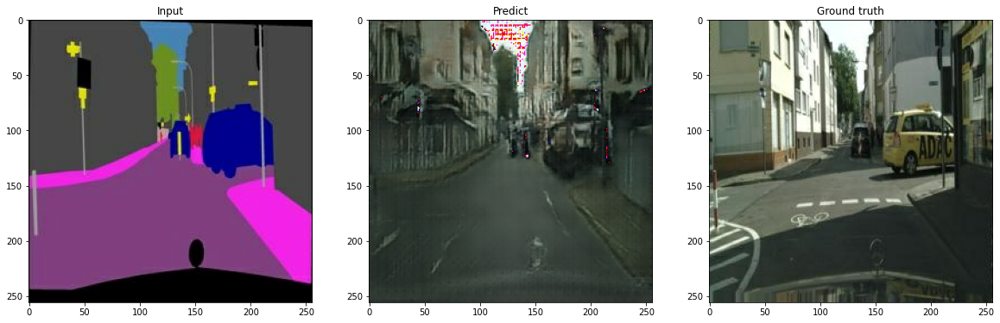

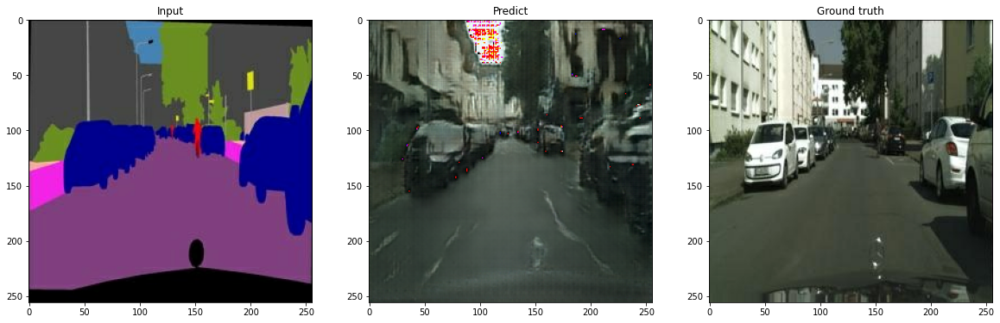

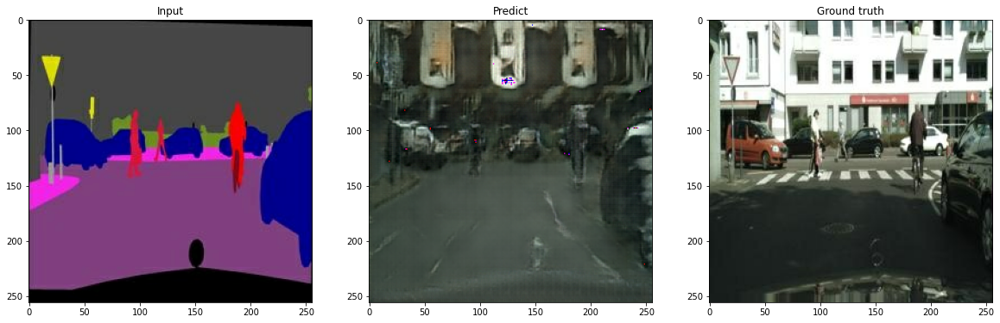

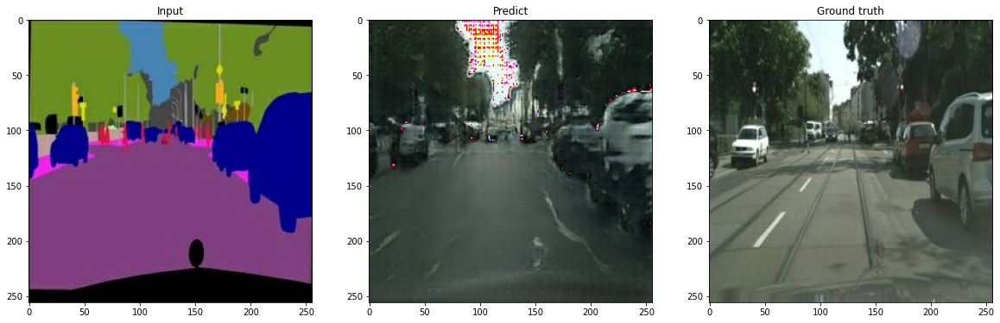

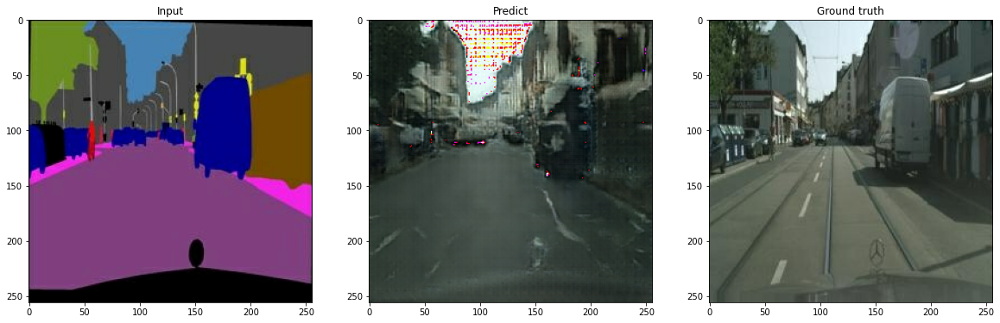

In [ ]:
test_ind = 1

for i in range(len(os.listdir(val_path))):
    f = val_path + os.listdir(val_path)[i]
    segment, city = load_img(f)

    pred = generator(tf.expand_dims(segment, 0))
    pred = denormalize(pred)

    plt.figure(figsize=(20,10))
    plt.subplot(1,3,1); plt.imshow(denormalize(segment)); plt.title('Input')
    plt.subplot(1,3,2); plt.imshow(pred[0]); plt.title('Predict')
    plt.subplot(1,3,3); plt.imshow(denormalize(city)); plt.title('Ground truth')

- 생각보다 좋지 못합니다.  
개선할 부분이 많아 보입니다.

## 2. Model Upgrade

- 모델을 개선합니다. 일단 Optimizer 먼저 손봅니다.  
- 다른 optimizer를 다 사용하는 것이 아닌 AdaBelief라는 optimizer만 사용합니다.  
GAN에 좋다고 합니다.

### 2.1 Model_0(Default, AdaBelief, epoch=100)

- 과정은 동일하니 빠르게 넘어갑니다.

#### 2.1.1 Generator

In [37]:
class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu= layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

In [38]:
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)

In [39]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512]
        decode_filters = [512,512,512,512,256,128,64]
        
        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))
        
        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))
        
        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)
    
    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)
        
        features = features[:-1]
                    
        for block, feat in zip(self.decode_blocks, features[::-1]):
            x = block(x)
            x = layers.Concatenate()([x, feat])
        
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

In [40]:
UNetGenerator().get_summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 encode_block_9 (EncodeBlock)   (None, 128, 128, 64  3072        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 encode_block_10 (EncodeBlock)  (None, 64, 64, 128)  131584      ['encode_block_9[0][0]']         
                                                                                              

#### 2.1.2 Discriminator

In [41]:
class DiscBlock(layers.Layer):
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act
        
        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)
        
        self.batchnorm = layers.BatchNormalization() if use_bn else None
        self.lrelu = layers.LeakyReLU(0.2) if act else None
        
    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)
                
        if self.use_bn:
            x = self.batchnorm(x)
            
        if self.act:
            x = self.lrelu(x)
        return x 

In [42]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.block1 = layers.Concatenate()
        self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
        self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block5 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
        self.block6 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
        self.sigmoid = layers.Activation("sigmoid")
    
    def call(self, x, y):
        out = self.block1([x, y])
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        return self.sigmoid(out)
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()

In [43]:
Discriminator().get_summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 concatenate_48 (Concatenate)   (None, 256, 256, 6)  0           ['input_2[0][0]',                
                                                                  'input_3[0][0]']          

#### 2.1.3 Loss

In [44]:
bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()

def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss

def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

#### 2.1.4 Train

##### 1) Optimizer

- Hyper-Parameter의 기준은 PyTorch 기준이지만 공식 git을 참고했습니다.  
https://github.com/juntang-zhuang/Adabelief-Optimizer

In [45]:
gene_opt = AdaBeliefOptimizer(learning_rate=2e-4, epsilon=1e-12, rectify=False, print_change_log = False)
disc_opt = AdaBeliefOptimizer(learning_rate=2e-4, epsilon=1e-12, rectify=False, print_change_log = False)

##### 2) Train Step

In [46]:
@tf.function
def train_step(segment, real_city):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake_city = generator(segment, training=True)
        # Discriminator 예측
        fake_disc = discriminator(segment, fake_city, training=True)
        real_disc = discriminator(segment, real_city, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_city, real_city, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

In [49]:
# Epochs 설정
EPOCHS = 100

# CheckPoint 설정
save_every = 20

# Generator, Discriminator 설정
generator = UNetGenerator()
discriminator = Discriminator()

In [50]:
checkpoint_dir = '/gdrive/My Drive/Colab Notebooks/cityscapes/checkpoint/model_0'

checkpoint_prefix = os.path.join(checkpoint_dir, 'ckpt')
checkpoint = tf.train.Checkpoint(generator_optimizer=gene_opt,
                                discriminator_optimizer=disc_opt,
                                generator=generator,
                                discriminator=discriminator)

##### 3) Train

In [ ]:
history_0 = {'G_loss': [] , 'L1_loss': [], 'D_loss': []}

for epoch in range(1, EPOCHS+1):
    for i, (segment, city) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(segment, city)

    history_0['G_loss'].append(g_loss.numpy())
    history_0['L1_loss'].append(l1_loss.numpy())
    history_0['D_loss'].append(d_loss.numpy())

    # epoch 20번에 한번씩 체크포인트 생성
    if (epoch + 1) % save_every == 0:
        checkpoint.save(file_prefix=checkpoint_prefix)
        print('check point epoch: ', epoch + 1)

    print(f"EPOCH[{epoch}] - STEP[{i+1}] \
            \nGenerator_loss:{g_loss.numpy():.4f} \
            L1_loss:{l1_loss.numpy():.4f} \
            Discriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

#### 2.1.5 Predict

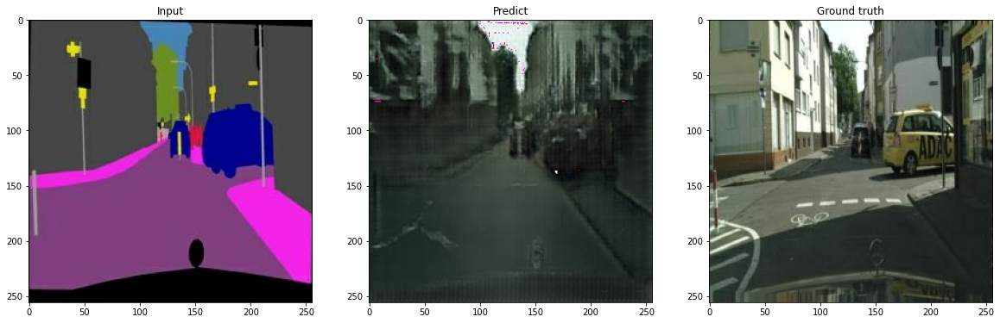

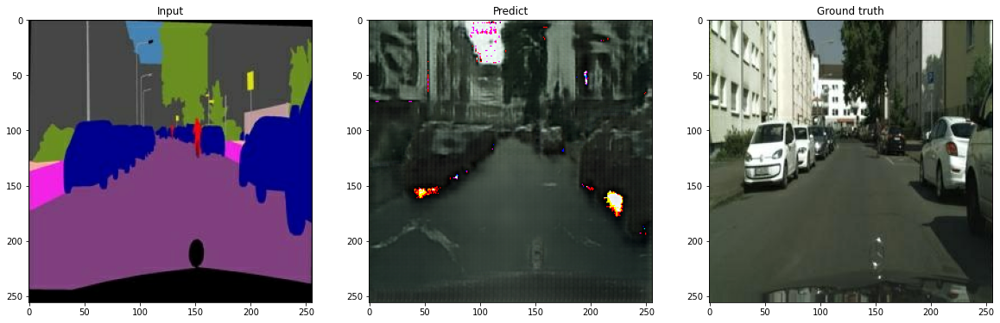

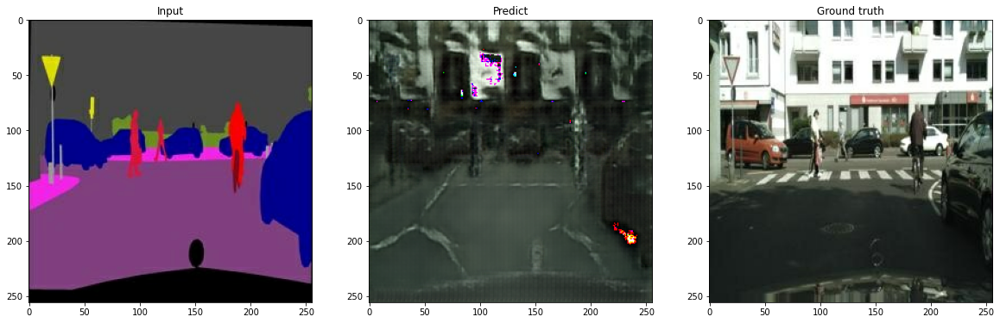

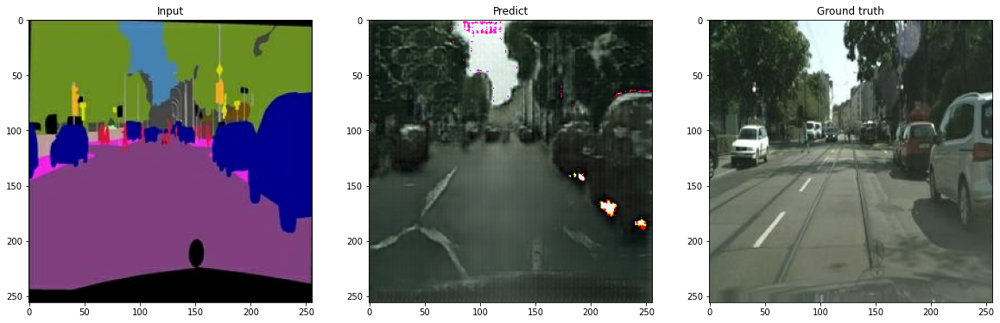

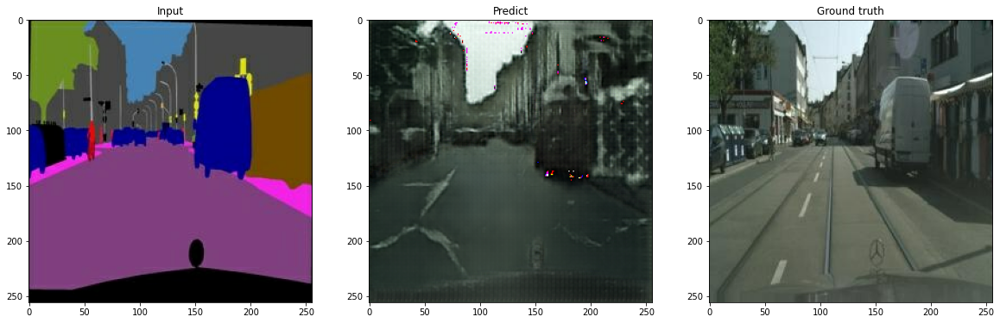

In [52]:
test_ind = 1

for i in range(len(os.listdir(val_path))):
    f = val_path + os.listdir(val_path)[i]
    segment, city = load_img(f)

    pred = generator(tf.expand_dims(segment, 0))
    pred = denormalize(pred)

    plt.figure(figsize=(20,10))
    plt.subplot(1,3,1); plt.imshow(denormalize(segment)); plt.title('Input')
    plt.subplot(1,3,2); plt.imshow(pred[0]); plt.title('Predict')
    plt.subplot(1,3,3); plt.imshow(denormalize(city)); plt.title('Ground truth')

- Default 값인 Adam Optimizer와 결과물은 비슷해 보이지만, 예측 이미지의 Segmentation 같은 noise가 조금 더 적어보입니다. 

### 2.2 Model_1(Default, AdaBeilef, epoch=300)

- 모든 조건이 동일한 상태에서 Optimizer의 차이로 결과물이 비슷하거나 약간 개선된 부분을 확인했기 때문에   
이번에는 epoch를 100에서 300으로 늘려 더 학습시켜봅니다.

#### 2.2.1 Generator

In [ ]:
class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu= layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

In [ ]:
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)

In [ ]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512]
        decode_filters = [512,512,512,512,256,128,64]
        
        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))
        
        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))
        
        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)
    
    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)
        
        features = features[:-1]
                    
        for block, feat in zip(self.decode_blocks, features[::-1]):
            x = block(x)
            x = layers.Concatenate()([x, feat])
        
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

In [ ]:
UNetGenerator().get_summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 encode_block_9 (EncodeBlock)   (None, 128, 128, 64  3072        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 encode_block_10 (EncodeBlock)  (None, 64, 64, 128)  131584      ['encode_block_9[0][0]']         
                                                                                              

#### 2.2.2 Discriminator

In [ ]:
class DiscBlock(layers.Layer):
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act
        
        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)
        
        self.batchnorm = layers.BatchNormalization() if use_bn else None
        self.lrelu = layers.LeakyReLU(0.2) if act else None
        
    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)
                
        if self.use_bn:
            x = self.batchnorm(x)
            
        if self.act:
            x = self.lrelu(x)
        return x 

In [ ]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.block1 = layers.Concatenate()
        self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
        self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block5 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
        self.block6 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
        self.sigmoid = layers.Activation("sigmoid")
    
    def call(self, x, y):
        out = self.block1([x, y])
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        return self.sigmoid(out)
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()

In [ ]:
Discriminator().get_summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 concatenate_48 (Concatenate)   (None, 256, 256, 6)  0           ['input_2[0][0]',                
                                                                  'input_3[0][0]']          

#### 2.2.3 Loss

In [ ]:
bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()

def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss

def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

#### 2.2.4 Train

##### 1) Optimizer

In [ ]:
gene_opt = AdaBeliefOptimizer(learning_rate=2e-4, epsilon=1e-12, rectify=False, print_change_log = False)
disc_opt = AdaBeliefOptimizer(learning_rate=2e-4, epsilon=1e-12, rectify=False, print_change_log = False)

##### 2) Train Step

In [ ]:
@tf.function
def train_step(segment, real_city):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake_city = generator(segment, training=True)
        # Discriminator 예측
        fake_disc = discriminator(segment, fake_city, training=True)
        real_disc = discriminator(segment, real_city, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_city, real_city, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

In [53]:
# Epochs 설정
EPOCHS = 300

# CheckPoint 설정
save_every = 50

# Generator, Discriminator 설정
generator = UNetGenerator()
discriminator = Discriminator()

In [ ]:
checkpoint_dir = '/gdrive/My Drive/Colab Notebooks/cityscapes/checkpoint/model_0'

checkpoint_prefix = os.path.join(checkpoint_dir, 'ckpt')
checkpoint = tf.train.Checkpoint(generator_optimizer=gene_opt,
                                discriminator_optimizer=disc_opt,
                                generator=generator,
                                discriminator=discriminator)

##### 3) Train

In [ ]:
history_1 = {'G_loss': [] , 'L1_loss': [], 'D_loss': []}

for epoch in range(1, EPOCHS+1):
    for i, (segment, city) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(segment, city)

    history_1['G_loss'].append(g_loss.numpy())
    history_1['L1_loss'].append(l1_loss.numpy())
    history_1['D_loss'].append(d_loss.numpy())

    # epoch 20번에 한번씩 체크포인트 생성
    if (epoch + 1) % save_every == 0:
        checkpoint.save(file_prefix=checkpoint_prefix)
        print('check point epoch: ', epoch + 1)

    print(f"EPOCH[{epoch}] - STEP[{i+1}] \
            \nGenerator_loss:{g_loss.numpy():.4f} \
            L1_loss:{l1_loss.numpy():.4f} \
            Discriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

#### 2.2.5 Predict

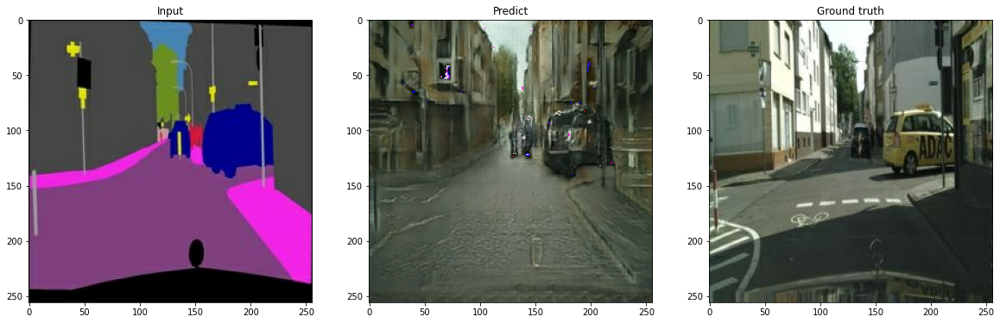

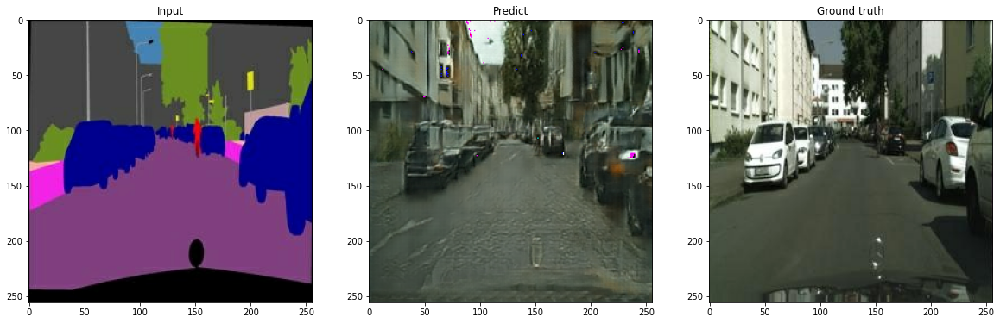

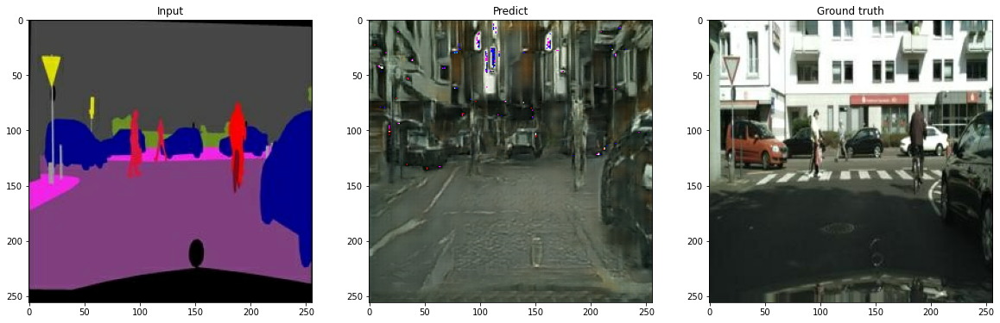

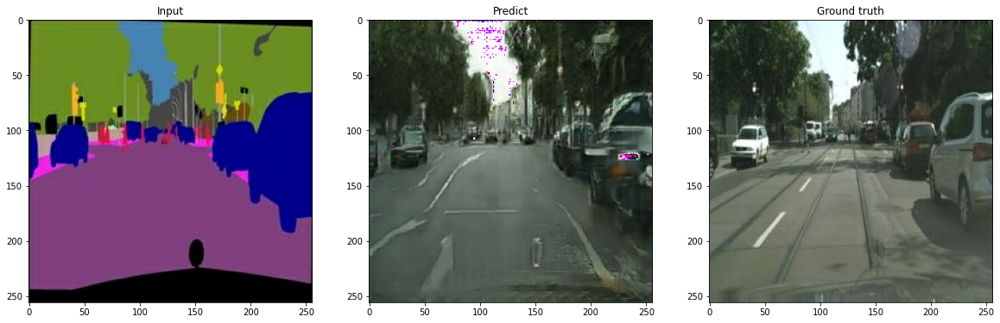

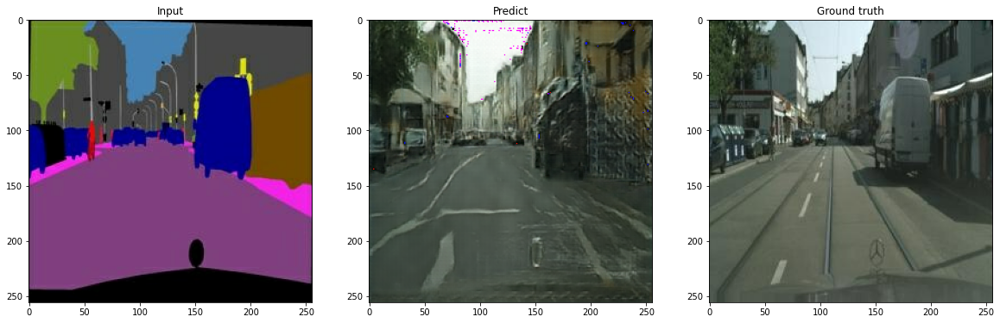

In [65]:
test_ind = 1

for i in range(len(os.listdir(val_path))):
    f = val_path + os.listdir(val_path)[i]
    segment, city = load_img(f)

    pred = generator(tf.expand_dims(segment, 0))
    pred = denormalize(pred)

    plt.figure(figsize=(20,10))
    plt.subplot(1,3,1); plt.imshow(denormalize(segment)); plt.title('Input')
    plt.subplot(1,3,2); plt.imshow(pred[0]); plt.title('Predict')
    plt.subplot(1,3,3); plt.imshow(denormalize(city)); plt.title('Ground truth')

## epoch

In [ ]:
history_1 = {'G_loss': [] , 'L1_loss': [], 'D_loss': []}

for epoch in range(1, EPOCHS+1):
    for i, (segment, city) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(segment, city)

    history_1['G_loss'].append(g_loss.numpy())
    history_1['L1_loss'].append(l1_loss.numpy())
    history_1['D_loss'].append(d_loss.numpy())

    # epoch 20번에 한번씩 체크포인트 생성
    if (epoch + 1) % save_every == 0:
        checkpoint.save(file_prefix=checkpoint_prefix)
        print('check point epoch: ', epoch + 1)

    print(f"EPOCH[{epoch}] - STEP[{i+1}] \
            \nGenerator_loss:{g_loss.numpy():.4f} \
            L1_loss:{l1_loss.numpy():.4f} \
            Discriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

### 2.3 Model_2(add_layer, AdaBelief, epoch=100)

- 이번에는 Default 값에서 Layer를 늘리고, epoch는 100번으로 설정합니다.  
Optimizer는 AdaBelief를 사용합니다.

#### 2.3.1 Generator

In [24]:
class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, n_strides, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, n_strides, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu= layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

In [25]:
class DecodeBlock(layers.Layer):
    def __init__(self, f, n_strides, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, n_strides, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU(0.2)
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)

In [26]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512,512]
        decode_filters = [512,512,512,512,512,256,128,64]
        
        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, 2, use_bn=False))
            else:
                if f == 256:
                    self.encode_blocks.append(EncodeBlock(f, 1))
                else:
                    self.encode_blocks.append(EncodeBlock(f, 2))
        

        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f, 2))
            else:
                if f == 128:
                   self.decode_blocks.append(DecodeBlock(f, 1))
                else:
                   self.decode_blocks.append(DecodeBlock(f, 2, dropout=False))

        
        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)
    
    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)
        
        features = features[:-1]
                    
        for block, feat in zip(self.decode_blocks, features[::-1]):
            x = block(x)
            x = layers.Concatenate()([x, feat])
        
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

In [ ]:
UNetGenerator().get_summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 encode_block (EncodeBlock)     (None, 128, 128, 64  3072        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 encode_block_1 (EncodeBlock)   (None, 64, 64, 128)  131584      ['encode_block[0][0]']           
                                                                                              

#### 2.3.2 Dscriminator

In [27]:
class DiscBlock(layers.Layer):
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act
        
        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)
        
        self.batchnorm = layers.BatchNormalization() if use_bn else None
        self.lrelu = layers.LeakyReLU(0.2) if act else None
        
    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)
                
        if self.use_bn:
            x = self.batchnorm(x)
            
        if self.act:
            x = self.lrelu(x)
        return x 

In [28]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.block1 = layers.Concatenate()
        self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
        self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block5 = DiscBlock(n_filters=256, stride=1, custom_pad=False, use_bn=True, act=True)
        self.block6 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
        self.block7 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
        self.sigmoid = layers.Activation("sigmoid")
    
    def call(self, x, y):
        out = self.block1([x, y])
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        out = self.block7(out)
        return self.sigmoid(out)
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()

In [ ]:
Discriminator().get_summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 concatenate_8 (Concatenate)    (None, 256, 256, 6)  0           ['input_2[0][0]',                
                                                                  'input_3[0][0]']          

#### 2.3.3 Loss

In [29]:
bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()

def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss

def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

#### 2.3.4 Train

##### 1) Optimizer

In [30]:
gene_opt = AdaBeliefOptimizer(learning_rate=2e-4, epsilon=1e-12, rectify=False, print_change_log = False)
disc_opt = AdaBeliefOptimizer(learning_rate=2e-4, epsilon=1e-12, rectify=False, print_change_log = False)

##### 2) Train Step

In [ ]:
@tf.function
def train_step(segment, real_city):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake_city = generator(segment, training=True)
        # Discriminator 예측
        fake_disc = discriminator(segment, fake_city, training=True)
        real_disc = discriminator(segment, real_city, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_city, real_city, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

In [ ]:
# Epochs 설정
EPOCHS = 100

# CheckPoint 설정
save_every = 50

# Generator, Discriminator 설정
generator = UNetGenerator()
discriminator = Discriminator()

In [ ]:
checkpoint_dir = '/gdrive/My Drive/Colab Notebooks/cityscapes/checkpoint/'

checkpoint_prefix = os.path.join(checkpoint_dir, 'ckpt')
checkpoint = tf.train.Checkpoint(generator_optimizer=gene_opt,
                                discriminator_optimizer=disc_opt,
                                generator=generator,
                                discriminator=discriminator)

##### 3) Train

In [ ]:
history_2 = {'G_loss': [] , 'L1_loss': [], 'D_loss': []}

for epoch in range(1, EPOCHS+1):
    start_time = time.time()
    for i, (segment, city) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(segment, city)

    history_2['G_loss'].append(g_loss.numpy())
    history_2['L1_loss'].append(l1_loss.numpy())
    history_2['D_loss'].append(d_loss.numpy())

    # epoch 20번에 한번씩 체크포인트 생성
    if (epoch + 1) % save_every == 0:
        checkpoint.save(file_prefix=checkpoint_prefix)

    print(f"EPOCH[{epoch}] - STEP[{i+1}] \
           \nGenerator_loss:{g_loss.numpy():.4f} \
           L1_loss:{l1_loss.numpy():.4f} \
           Discriminator_loss:{d_loss.numpy():.4f} \
           TTime:{time.time() - start_time:.2f}", end="\n\n")

#### 2.3.5 Predict

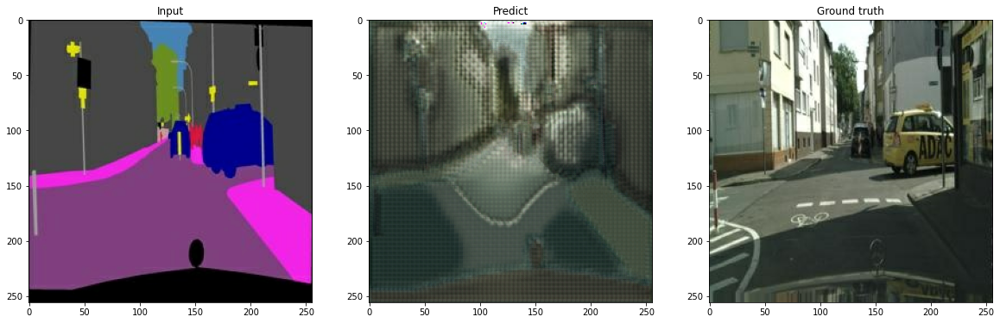

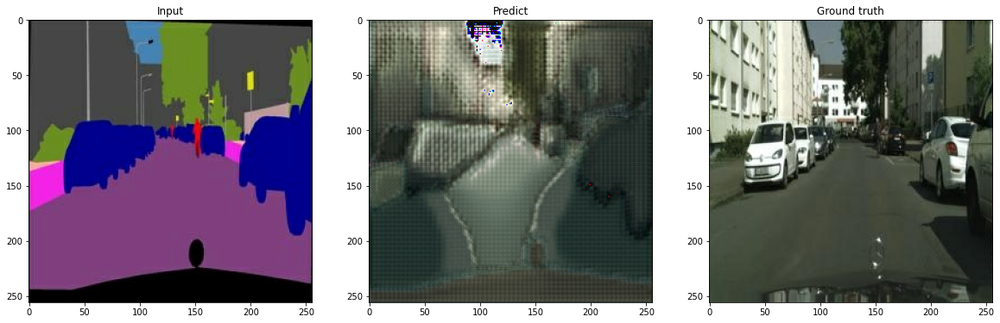

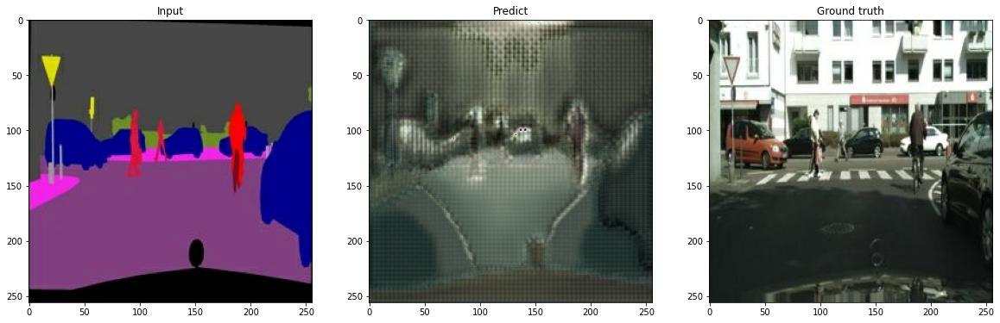

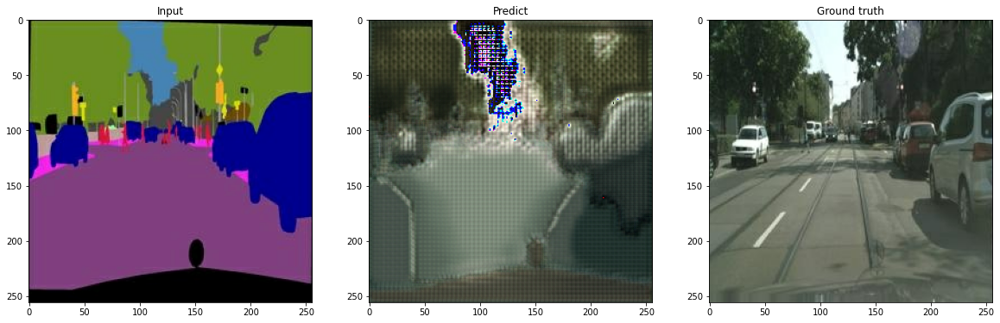

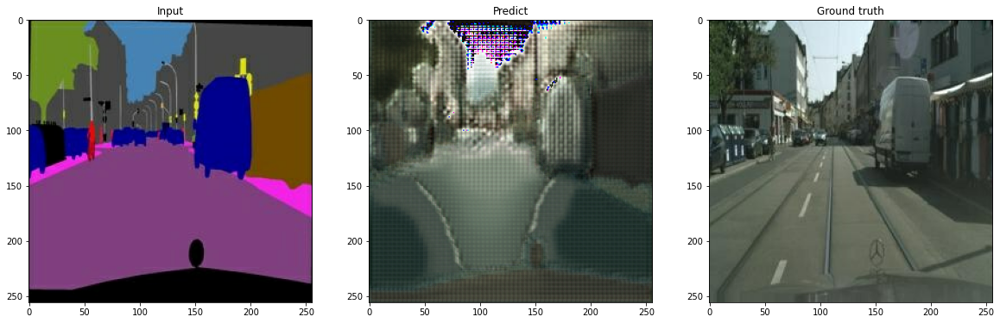

In [ ]:
test_ind = 1

for i in range(len(os.listdir(val_path))):
    f = val_path + os.listdir(val_path)[i]
    segment, city = load_img(f)

    pred = generator(tf.expand_dims(segment, 0))
    pred = denormalize(pred)

    plt.figure(figsize=(20,10))
    plt.subplot(1,3,1); plt.imshow(denormalize(segment)); plt.title('Input')
    plt.subplot(1,3,2); plt.imshow(pred[0]); plt.title('Predict')
    plt.subplot(1,3,3); plt.imshow(denormalize(city)); plt.title('Ground truth')

- 오히려 Default layer보다 결과물이 매우 안 좋습니다.  
코랩 런타임 때문에 loss 값이 지워졌지만 training 하는 동안 generator loss가 다른 값에 비해 상당히 높은 부분에서 튀는 현상을 보였습니다.

### 2.4 Model_3(add_layer, AdaBelief, epoch=300)

- 혹시 모르니 model_2(add_layer, AdaBelief, epoch=100)의 조건에서 epoch 값만 300으로 높여 진행합니다.

#### 2.4.1 Generator

In [ ]:
class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, n_strides, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, n_strides, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu= layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

In [ ]:
class DecodeBlock(layers.Layer):
    def __init__(self, f, n_strides, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, n_strides, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU(0.2)
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)

In [ ]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512,512]
        decode_filters = [512,512,512,512,512,256,128,64]
        
        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, 2, use_bn=False))
            else:
                if f == 256:
                    self.encode_blocks.append(EncodeBlock(f, 1))
                else:
                    self.encode_blocks.append(EncodeBlock(f, 2))
        

        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f, 2))
            else:
                if f == 128:
                   self.decode_blocks.append(DecodeBlock(f, 1))
                else:
                   self.decode_blocks.append(DecodeBlock(f, 2, dropout=False))

        
        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)
    
    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)
        
        features = features[:-1]
                    
        for block, feat in zip(self.decode_blocks, features[::-1]):
            x = block(x)
            x = layers.Concatenate()([x, feat])
        
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

In [ ]:
UNetGenerator().get_summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 encode_block_27 (EncodeBlock)  (None, 128, 128, 64  3072        ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 encode_block_28 (EncodeBlock)  (None, 64, 64, 128)  131584      ['encode_block_27[0][0]']        
                                                                                            

#### 2.4.2 Discriminator

In [ ]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.block1 = layers.Concatenate()
        self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
        self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block5 = DiscBlock(n_filters=256, stride=1, custom_pad=False, use_bn=True, act=True)
        self.block6 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
        self.block7 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
        self.sigmoid = layers.Activation("sigmoid")
    
    def call(self, x, y):
        out = self.block1([x, y])
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        out = self.block7(out)
        return self.sigmoid(out)
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()

In [ ]:
Discriminator().get_summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_6 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 concatenate_139 (Concatenate)  (None, 256, 256, 6)  0           ['input_5[0][0]',                
                                                                  'input_6[0][0]']          

#### 2.4.3 Loss

#### 2.4.4 Train

##### 1) Optimizer

In [31]:
gene_opt = AdaBeliefOptimizer(learning_rate=2e-4, beta_1=0.5, beta_2=0.999, epsilon=1e-14, rectify=False, print_change_log = False)
disc_opt = AdaBeliefOptimizer(learning_rate=2e-4, beta_1=0.5, beta_2=0.999, epsilon=1e-14, rectify=False, print_change_log = False)

##### 2) Train Step

In [32]:
@tf.function
def train_step(segment, real_city):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake_city = generator(segment, training=True)
        # Discriminator 예측
        fake_disc = discriminator(segment, fake_city, training=True)
        real_disc = discriminator(segment, real_city, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_city, real_city, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

In [33]:
# Epochs 설정
EPOCHS = 300

# CheckPoint 설정
save_every = 20

# Generator, Discriminator 설정
generator = UNetGenerator()
discriminator = Discriminator()

In [34]:
checkpoint_dir = '/gdrive/My Drive/Colab Notebooks/cityscapes/checkpoint/model_3'

checkpoint_prefix = os.path.join(checkpoint_dir, 'ckpt')
checkpoint = tf.train.Checkpoint(generator_optimizer=gene_opt,
                                discriminator_optimizer=disc_opt,
                                generator=generator,
                                discriminator=discriminator)

##### 3) Train

In [ ]:
history_2 = {'G_loss': [] , 'L1_loss': [], 'D_loss': []}

for epoch in range(1, EPOCHS+1):
    start_time = time.time()
    for i, (segment, city) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(segment, city)

    history_2['G_loss'].append(g_loss.numpy())
    history_2['L1_loss'].append(l1_loss.numpy())
    history_2['D_loss'].append(d_loss.numpy())

    # epoch 20번에 한번씩 체크포인트 생성
    if (epoch + 1) % save_every == 0:
        checkpoint.save(file_prefix=checkpoint_prefix)

    print(f"EPOCH[{epoch}] - STEP[{i+1}] \
           \nGenerator_loss:{g_loss.numpy():.4f} \
           L1_loss:{l1_loss.numpy():.4f} \
           Discriminator_loss:{d_loss.numpy():.4f} \
           TTime:{time.time() - start_time:.2f}", end="\n\n")

#### 2.4.5 Predict

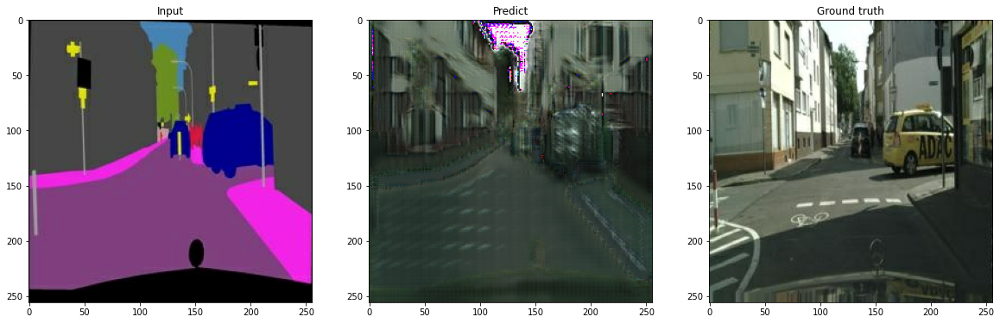

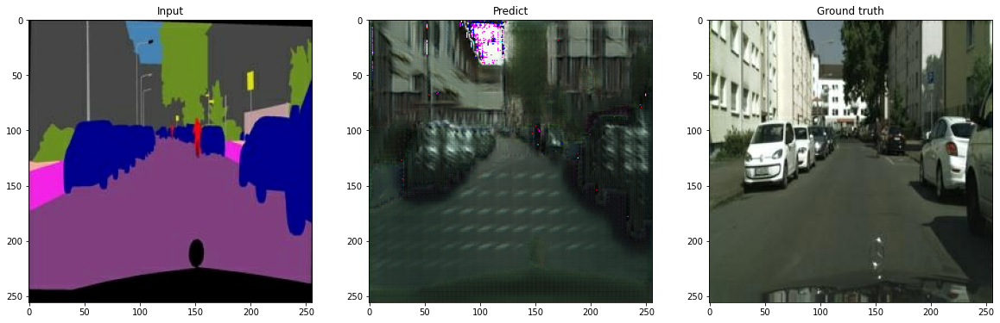

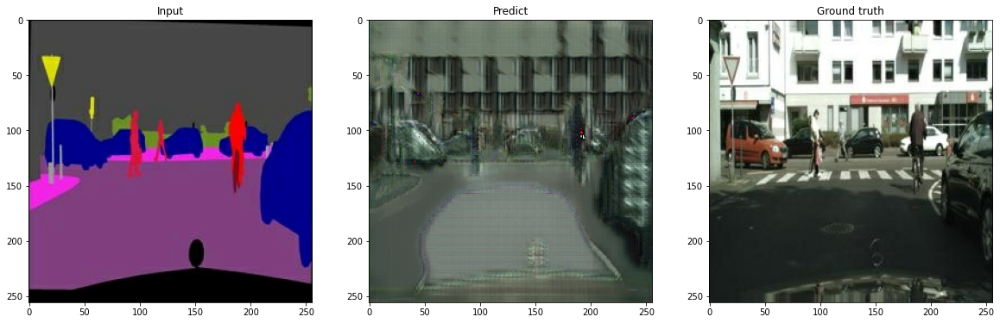

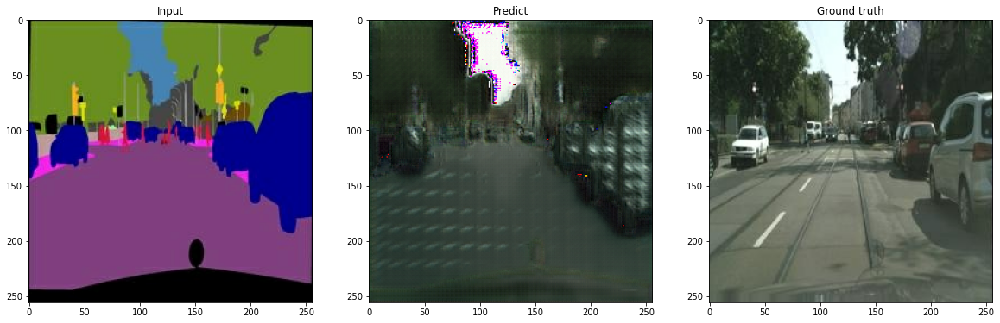

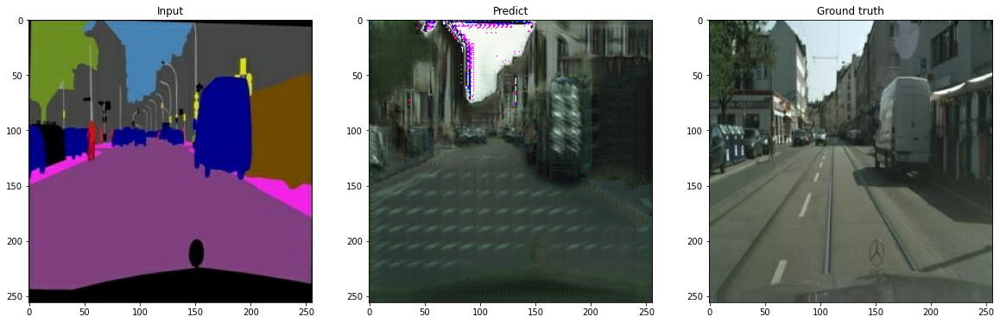

In [36]:
test_ind = 1

for i in range(len(os.listdir(val_path))):
    f = val_path + os.listdir(val_path)[i]
    segment, city = load_img(f)

    pred = generator(tf.expand_dims(segment, 0))
    pred = denormalize(pred)

    plt.figure(figsize=(20,10))
    plt.subplot(1,3,1); plt.imshow(denormalize(segment)); plt.title('Input')
    plt.subplot(1,3,2); plt.imshow(pred[0]); plt.title('Predict')
    plt.subplot(1,3,3); plt.imshow(denormalize(city)); plt.title('Ground truth')

- epoch=100보다 향상된 Predict를 뽑긴 했지만, 매우 불만족스러운 결과물입니다.
이걸 보려고 6시간을 기다렸습니다...

## 3. Augmentation

- Augmentation에 변화를 주어 모델을 다시 학습합니다.
- 비교를 위해 모든 조건(optimizer 포함)은 Default와 동일하게 적용합니다. 

### 3.1 Image load

In [82]:
data_path = '/gdrive/My Drive/Colab Notebooks/cityscapes/'
train_path = data_path+'train/'
val_path = data_path+'val/'

print("number of train examples :", len(os.listdir(train_path)))
print("number of validation examples :", len(os.listdir(val_path)))

number of train examples : 1000
number of validation examples : 5


In [83]:
f = train_path + os.listdir(train_path)[0]
img = cv2.imread(f, cv2.IMREAD_COLOR)
print(img.shape)

(256, 512, 3)


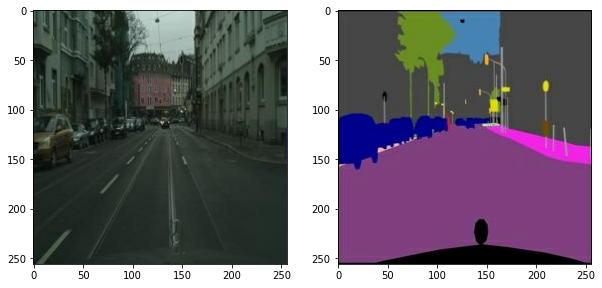

In [84]:
def normalize(x):  # 이미지 정규화 함수
    x = tf.cast(x, tf.float32)
    return (x/127.5) - 1

def denormalize(x):  # 이미지 시각화를 위한 복원 함수
    x = (x+1)*127.5
    x = x.numpy()
    return x.astype(np.uint8)

def load_img(img_path):  # 이미지 load 함수
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, 3)
    
    w = tf.shape(img)[1] // 2
    segment = img[:, w:, :] 
    segment = tf.cast(segment, tf.float32)
    city = img[:, :w, :] 
    city = tf.cast(city, tf.float32)
    return normalize(segment), normalize(city)

f = train_path + os.listdir(train_path)[1]
segment, city = load_img(f)

plt.figure(figsize=(10,7))
plt.subplot(1,2,1); plt.imshow(denormalize(city))
plt.subplot(1,2,2); plt.imshow(denormalize(segment))

### 3.2 Augmentation

- 이 부분에서 상당히 애를 먹었습니다.  
간단한 saturation 등의 기본 augmentation을 적용하는데도 error가 상당합니다.

In [221]:
@tf.function() # 빠른 텐서플로 연산을 위해 @tf.function()을 사용합니다. 
def apply_augmentation(segment, city):
    stacked = tf.concat([segment, city], axis=-1)
    
    _pad = tf.constant([[30,30],[30,30],[0,0]])
    if tf.random.uniform(()) < .5:
        padded = tf.pad(stacked, _pad, "REFLECT")
    else:
        padded = tf.pad(stacked, _pad, "CONSTANT", constant_values=1.)

    out = image.random_crop(padded, size=[256, 256, 6])
    out = image.random_flip_left_right(out)
    out = image.random_flip_up_down(out)

    # 이미지 대비 조절 추가
    out = image.random_contrast(out, lower=0.7, upper=1)
        
    if tf.random.uniform(()) < .5:
        degree = tf.random.uniform([], minval=1, maxval=4, dtype=tf.int32)
        out = image.rot90(out, k=degree)
        
        # 이미지 밝기 조절 추가
        out = image.adjust_brightness(out, 0.2)

        # 이미지 채도 조절은 error 발생
        # out = image.adjust_saturation(out, 0.5)
    
    return out[...,:3], out[...,3:]   

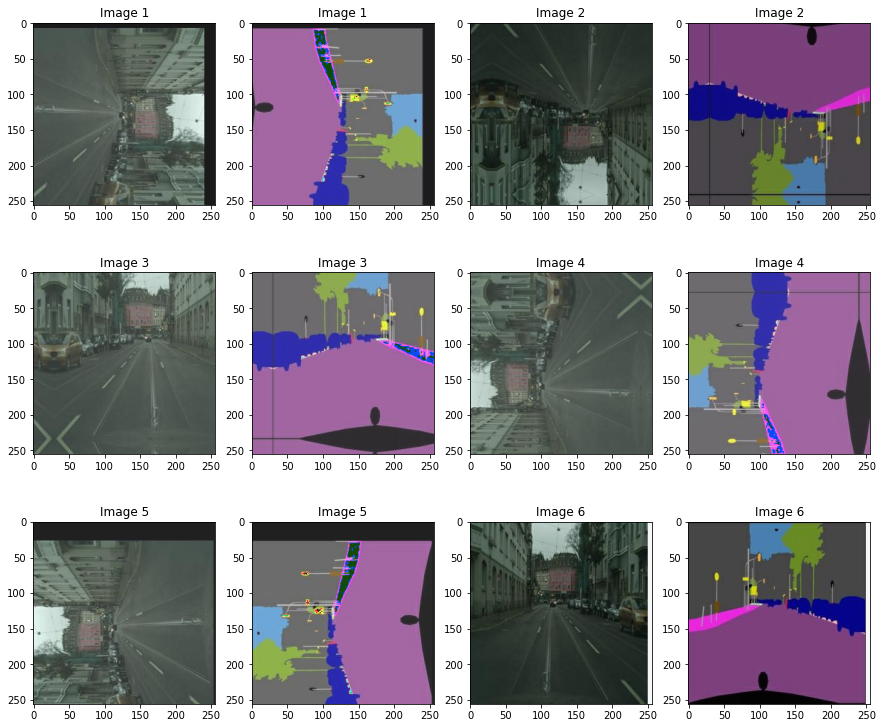

In [219]:
plt.figure(figsize=(15,13))
img_n = 1

for i in range(1, 13, 2):
    augmented_segment, augmented_city = apply_augmentation(segment, city)
    
    plt.subplot(3,4,i)
    plt.imshow(denormalize(augmented_city)); plt.title(f"Image {img_n}")
    plt.subplot(3,4,i+1); 
    plt.imshow(denormalize(augmented_segment)); plt.title(f"Image {img_n}")
    img_n += 1

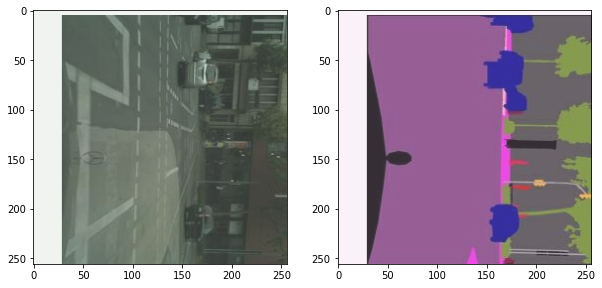

In [222]:
def get_train(img_path):
    segment, city = load_img(img_path)
    segment, city = apply_augmentation(segment, city)
    return segment, city

train_images = data.Dataset.list_files(train_path + "*.jpg")
train_images = train_images.map(get_train).shuffle(100).batch(4)

sample = train_images.take(1)
sample = list(sample.as_numpy_iterator())
segment, city = (sample[0][0]+1)*127.5, (sample[0][1]+1)*127.5

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(city[0].astype(np.uint8))
plt.subplot(1,2,2); plt.imshow(segment[0].astype(np.uint8))

### 3.3 Model_5(Default, Adam, epoch=100)

#### 3.3.1 Generator

In [15]:
class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu= layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

In [16]:
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)

In [17]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512]
        decode_filters = [512,512,512,512,256,128,64]
        
        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))
        
        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))
        
        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)
    
    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)
        
        features = features[:-1]
                    
        for block, feat in zip(self.decode_blocks, features[::-1]):
            x = block(x)
            x = layers.Concatenate()([x, feat])
        
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

In [226]:
UNetGenerator().get_summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 encode_block_41 (EncodeBlock)  (None, 128, 128, 64  3072        ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 encode_block_42 (EncodeBlock)  (None, 64, 64, 128)  131584      ['encode_block_41[0][0]']        
                                                                                            

#### 3.3.2 Discriminator

In [18]:
class DiscBlock(layers.Layer):
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act
        
        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)
        
        self.batchnorm = layers.BatchNormalization() if use_bn else None
        self.lrelu = layers.LeakyReLU(0.2) if act else None
        
    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)
                
        if self.use_bn:
            x = self.batchnorm(x)
            
        if self.act:
            x = self.lrelu(x)
        return x 

In [19]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.block1 = layers.Concatenate()
        self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
        self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block5 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
        self.block6 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
        self.sigmoid = layers.Activation("sigmoid")
    
    def call(self, x, y):
        out = self.block1([x, y])
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        return self.sigmoid(out)
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()

In [232]:
Discriminator().get_summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_8 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 concatenate_165 (Concatenate)  (None, 256, 256, 6)  0           ['input_7[0][0]',                
                                                                  'input_8[0][0]']          

#### 3.3.3 Loss

In [20]:
bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()

def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss

def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

#### 3.3.4 Train

##### 1) Optimizer

In [21]:
gene_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)
disc_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)

##### 2) Train Step

In [22]:
@tf.function
def train_step(segment, real_city):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake_city = generator(segment, training=True)
        # Discriminator 예측
        fake_disc = discriminator(segment, fake_city, training=True)
        real_disc = discriminator(segment, real_city, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_city, real_city, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

In [23]:
# Epochs 설정
EPOCHS = 100

# CheckPoint 설정
save_every = 50

# Generator, Discriminator 설정
generator = UNetGenerator()
discriminator = Discriminator()

In [24]:
checkpoint_dir = '/gdrive/My Drive/Colab Notebooks/cityscapes/checkpoint/model_7'

checkpoint_prefix = os.path.join(checkpoint_dir, 'ckpt')
checkpoint = tf.train.Checkpoint(generator_optimizer=gene_opt,
                                discriminator_optimizer=disc_opt,
                                generator=generator,
                                discriminator=discriminator)

##### 3) Train

In [ ]:
history_5 = {'G_loss': [] , 'L1_loss': [], 'D_loss': []}

for epoch in range(1, EPOCHS+1):
    start_time = time.time()
    for i, (segment, city) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(segment, city)

    history_5['G_loss'].append(g_loss.numpy())
    history_5['L1_loss'].append(l1_loss.numpy())
    history_5['D_loss'].append(d_loss.numpy())

    # epoch 20번에 한번씩 체크포인트 생성
    if (epoch + 1) % save_every == 0:
        checkpoint.save(file_prefix=checkpoint_prefix)
        print('check point epoch: ', epoch + 1)

    print(f"EPOCH[{epoch}] - STEP[{i+1}] \
            \nGenerator_loss:{g_loss.numpy():.4f} \
            L1_loss:{l1_loss.numpy():.4f} \
            Discriminator_loss:{d_loss.numpy():.4f} \
            TTime:{time.time() - start_time:.2f}", end="\n\n")

#### 3.3.5 Predict

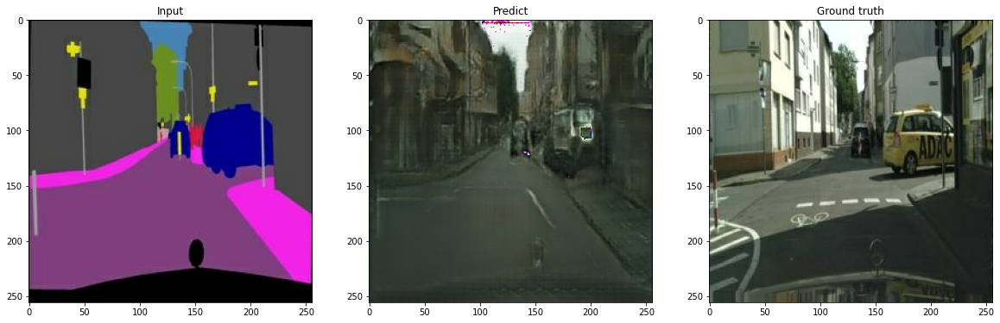

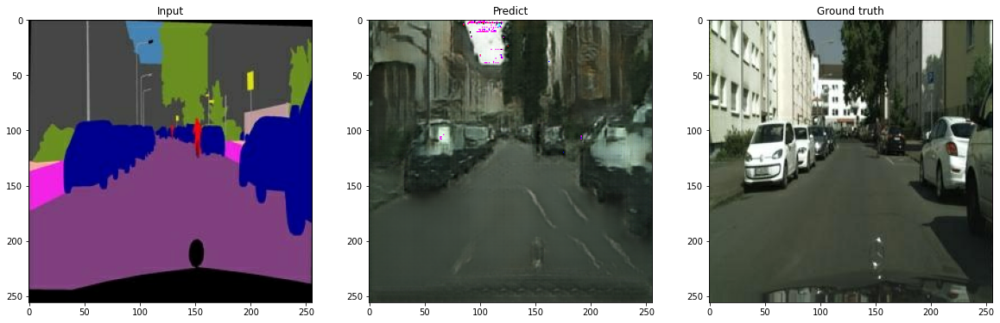

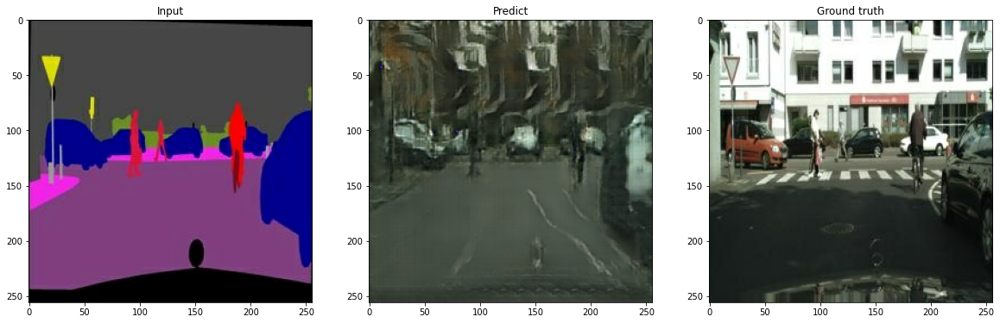

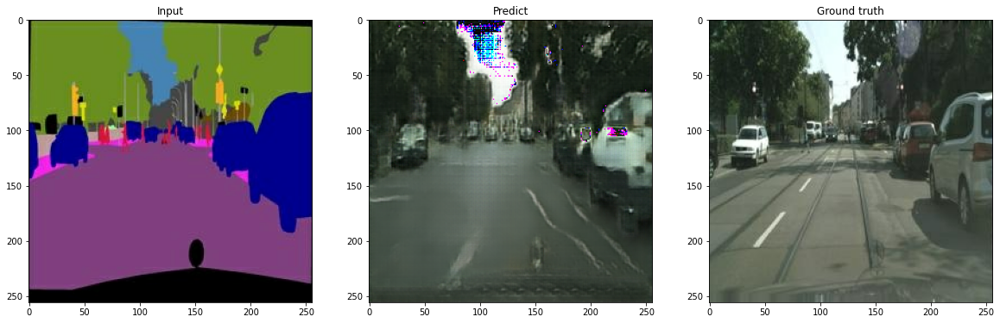

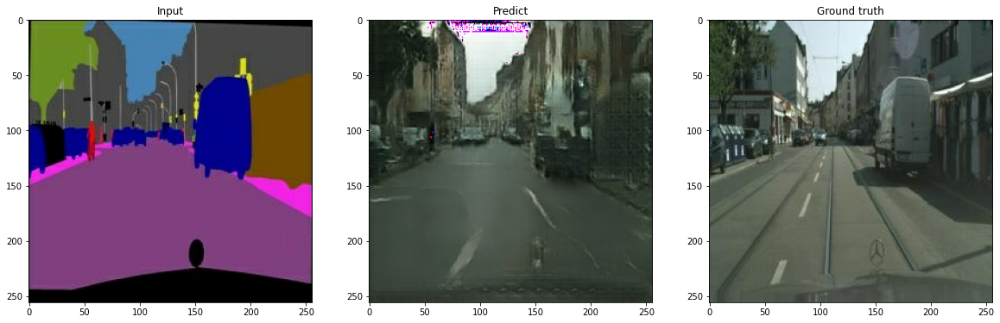

In [239]:
test_ind = 1

for i in range(len(os.listdir(val_path))):
    f = val_path + os.listdir(val_path)[i]
    segment, city = load_img(f)

    pred = generator(tf.expand_dims(segment, 0))
    pred = denormalize(pred)

    plt.figure(figsize=(20,10))
    plt.subplot(1,3,1); plt.imshow(denormalize(segment)); plt.title('Input')
    plt.subplot(1,3,2); plt.imshow(pred[0]); plt.title('Predict')
    plt.subplot(1,3,3); plt.imshow(denormalize(city)); plt.title('Ground truth')

- Default 이미지보다 노이즈는 덜 한 느낌이 있지만, 눈에 띌 정도의 변화는 아닌 것 같습니다.  
다만 이미지가 전채적으로 밝아진 느낌입니다.

### 3.4 Model_6(Default, Adam, epoch=300)

- 바로 위에서 돌린 모델에 epoch 200을 추가하여 총 epoch 300으로 학습시킵니다.

In [240]:
# Epochs 설정
EPOCHS = 200

# CheckPoint 설정
save_every = 50

# Generator, Discriminator 설정
generator = UNetGenerator()
discriminator = Discriminator()

In [ ]:
checkpoint_dir = '/gdrive/My Drive/Colab Notebooks/cityscapes/checkpoint/model_7'

checkpoint_prefix = os.path.join(checkpoint_dir, 'ckpt')
checkpoint = tf.train.Checkpoint(generator_optimizer=gene_opt,
                                discriminator_optimizer=disc_opt,
                                generator=generator,
                                discriminator=discriminator)

In [25]:
EPOCHS = 50

In [ ]:
history_7 = {'G_loss': [] , 'L1_loss': [], 'D_loss': []}

for epoch in range(1, EPOCHS+1):
    start_time = time.time()
    for i, (segment, city) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(segment, city)

    history_7['G_loss'].append(g_loss.numpy())
    history_7['L1_loss'].append(l1_loss.numpy())
    history_7['D_loss'].append(d_loss.numpy())

    # epoch 20번에 한번씩 체크포인트 생성
    if (epoch + 1) % save_every == 0:
        checkpoint.save(file_prefix=checkpoint_prefix)
        print('check point epoch: ', epoch + 1)

    print(f"EPOCH[{epoch}] - STEP[{i+1}] \
            \nGenerator_loss:{g_loss.numpy():.4f} \
            L1_loss:{l1_loss.numpy():.4f} \
            Discriminator_loss:{d_loss.numpy():.4f} \
            TTime:{time.time() - start_time:.2f}", end="\n\n")

EPOCH[1] - STEP[250]             
Generator_loss:1.3911             L1_loss:0.1737             Discriminator_loss:0.6388             TTime:62.05

EPOCH[2] - STEP[250]             
Generator_loss:1.5272             L1_loss:0.1691             Discriminator_loss:0.4344             TTime:44.41

EPOCH[3] - STEP[250]             
Generator_loss:0.7209             L1_loss:0.1779             Discriminator_loss:1.1538             TTime:44.74



In [ ]:
test_ind = 1

for i in range(len(os.listdir(val_path))):
    f = val_path + os.listdir(val_path)[i]
    segment, city = load_img(f)

    pred = generator(tf.expand_dims(segment, 0))
    pred = denormalize(pred)

    plt.figure(figsize=(20,10))
    plt.subplot(1,3,1); plt.imshow(denormalize(segment)); plt.title('Input')
    plt.subplot(1,3,2); plt.imshow(pred[0]); plt.title('Predict')
    plt.subplot(1,3,3); plt.imshow(denormalize(city)); plt.title('Ground truth')

## 4. Retrospect

##### 1) U-Net++
- U-Net의 발전된 아키텍쳐인 Nested U-Net을 써보고 싶었습니다.  
기존의 U-Net과는 다르게 skip connetion에 covolution layer가 있어서 encoder의 정보가 1:1로 매칭되는게 아니라 신경망처럼 연결되어 있다는 점이 흥미로웠습니다.  
정말 써보고 싶었는데 시간이 부족하여 다음에 써보려합니다.

##### 2) AdaBelief
- 이번에는 Nadam, Radam, AdamW 등의 다양한 Optimizer를 사용하지 않았습니다.  
AdaBelief가 GAN에서 효율적이라는 말을 들어서 AdaBelief만 사용하여 돌렸습니다.  
data, epoch이 적어 결과물을 보면 큰 차이는 없어보입니다만, 예측의 노이즈가 조금 적었다는 부분이 인상적이었습니다.

##### 3) Layer
- Generator와 Discriminator의 Layer를 모두 늘렸습니다.  
특히 Generator에서 output의 크기를 맞추기 위해 하나의 Dense layer에서 strides를 (1,1)로 맞추고, Dense(512)를 추가했습니다.  
epoch도 100, 300으로 나름 결과를 확인하기에 의미가 있다고 생각할 정도로 수행했습니다.  
결과물을 보면 알 수 있지만, layer를 늘리는 행동이 예측에는 좋지 않다고 생각합니다.  
이래서 Nested U-Net 등 U-Net의 발전된 아키텍쳐를 써보고 싶었습니다.

##### 4) Augmentation
- Augmentation에 대해 많은 내용을 찾아봤습니다.  
다 적용해 보고 싶었으나 error가 상당하여 밝기와 대비 수준만 조절했습니다.  
처음부터 cv2 등을 이용해 blur를 적용하고 saturation, cutout, scaling 등을 이용하면 더 풍부한 image dataset을 만들 수 있을 것 같습니다.  
시간 여유가 생기면 추가로 더 작업해보려 합니다.

## 5. References

- 아래의 사이트에서 큰 도움을 받았습니다.

##### 1) Augmentation
- https://www.tensorflow.org/tutorials/images/data_augmentation
- https://www.tensorflow.org/api_docs/python/tf/image/random_crop
- https://towardsdatascience.com/image-augmentation-mastering-15-techniques-and-useful-functions-with-python-codes-44c3f8c1ea1f
- https://meissa.tistory.com/m/71
- https://foreverhappiness.tistory.com/112

##### 2) AdaBelief Optimizer
- https://juntang-zhuang.github.io/adabelief/
- https://github.com/juntang-zhuang/Adabelief-Optimizer

##### 3) Pix2Pix
- https://www.tensorflow.org/tutorials/generative/pix2pix

##### 4) U-Net++
- https://github.com/CarryHJR/Nested-UNet
- https://blog.promedius.ai/unet-unet3/

##### 5) layer
- https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv2D
- https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv2DTranspose

##### 6) training loop
- https://www.tensorflow.org/guide/keras/writing_a_training_loop_from_scratch